In [ ]:
import matplotlib.pyplot as plt
from collections import Counter

In [52]:
file_path = "ensemble_exp/mel_modgd_gamma_cqtDefMel/test/diversity"
# List to store results
file_identifiers = []
token_sequences = []

with open(file_path, "r", encoding="utf-8") as file:
    for line in file:
        identifier, tokens = line.split(" ", 1)  
        file_identifiers.append(identifier)  
        example_level_2 = tokens.split('] [')
        example_level_2[0] = example_level_2[0][1:]
        print(example_level_2)
        example_level_2[-1] = example_level_2[-1][:-2]
        print(example_level_2)
        parsed_tokens = [list(eval( examp_level_2)) for examp_level_2 in example_level_2]
        print(parsed_tokens)
        token_sequences.append(parsed_tokens)  

#print(f"First Identifier: {file_identifiers[0]}")
#print(f"First Token Sequence: {token_sequences}")

['759, 759, 759, 759, 759, 759', '254, 254, 254, 254, 254, 254', '24, 24, 24, 24, 24, 24', '48, 48, 48, 48, 48, 48', '95, 95, 95, 95, 95, 95', '296, 296, 296, 296, 296, 296', '475, 475, 475, 475, 475, 475', '806, 806, 806, 806, 806, 806', '533, 533, 533, 533, 533, 533', '788, 788, 1938, 1938, 1938, 788', '2, 2, 2, 2, 2, 2', '224, 224, 224, 224, 224, 224', '425, 425, 425, 425, 425, 425', '4232, 4232, 4232, 4232, 4232, 4232]\n']
['759, 759, 759, 759, 759, 759', '254, 254, 254, 254, 254, 254', '24, 24, 24, 24, 24, 24', '48, 48, 48, 48, 48, 48', '95, 95, 95, 95, 95, 95', '296, 296, 296, 296, 296, 296', '475, 475, 475, 475, 475, 475', '806, 806, 806, 806, 806, 806', '533, 533, 533, 533, 533, 533', '788, 788, 1938, 1938, 1938, 788', '2, 2, 2, 2, 2, 2', '224, 224, 224, 224, 224, 224', '425, 425, 425, 425, 425, 425', '4232, 4232, 4232, 4232, 4232, 4232']
[[759, 759, 759, 759, 759, 759], [254, 254, 254, 254, 254, 254], [24, 24, 24, 24, 24, 24], [48, 48, 48, 48, 48, 48], [95, 95, 95, 95, 95, 95]

Total number of incorrect predictions is: 0.026325585834963968
Total number of rows is: 104765
Total percentage of incorrect predictions is: 2.63


/tmp/ipykernel_1296398/3732381064.py:29: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend()


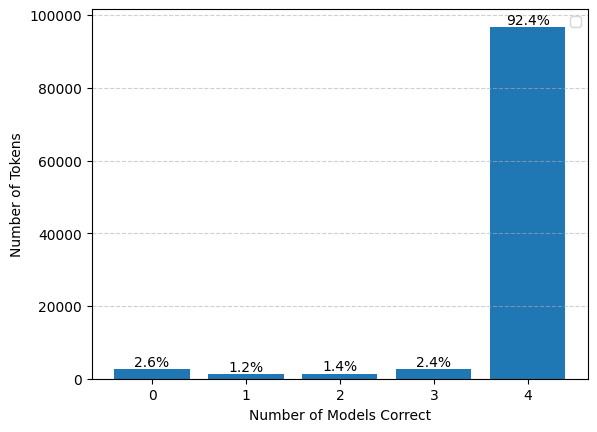

In [54]:

correct_hits_counter = Counter()
for transcript in token_sequences:
    for row in transcript[:-1]:
        predictions = row[:4]  # First four values are model predictions
        ground_truth = row[4]  # The fifth value is the ground truth
        ensemble = row[5]
        correct_hits = sum(1 for pred in predictions if pred == ground_truth)
        correct_hits_counter[correct_hits] += 1



x_values = list(correct_hits_counter.keys())
y_values = [correct_hits_counter[x] for x in x_values]
print(f"Total number of incorrect predictions is: {correct_hits_counter[0]/sum([correct_hits_counter[i] for i in range(5)])}")
total_rows = sum(y_values)
print(f"Total number of rows is: {total_rows}")
percentages = [(count / total_rows) * 100 for count in y_values]

print(f"Total percentage of incorrect predictions is: {correct_hits_counter[0]*100 / total_rows:.2f}")


plt.bar(x_values, y_values)
for i, (x, y, pct) in enumerate(zip(x_values, y_values, percentages)):
    plt.text(x, y + 0.5, f"{pct:.1f}%", ha="center", va="bottom")
plt.grid(axis='y', linestyle='--', alpha=0.6)
plt.xlabel("Number of Models Correct")
plt.ylabel("Number of Tokens")
plt.xticks(range(5))  
plt.legend()
plt.show()



Correct hits : Counter({4: 96787, 0: 2758, 3: 2546, 2: 1433, 1: 1241})
[0, 1213, 518, 302]
[0.0, 1.157829427766907, 0.49443993700186134, 0.2882642103756025]


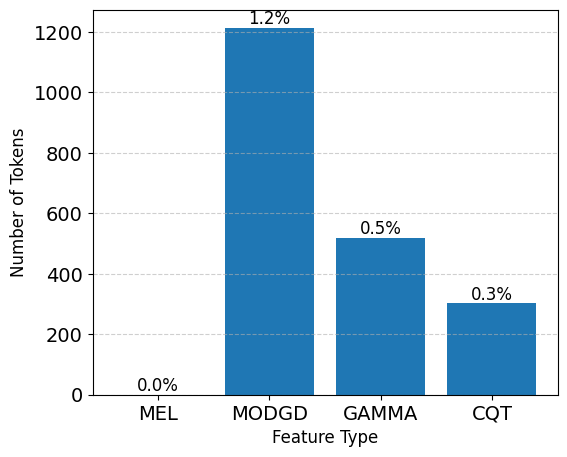

In [56]:
correct_hits_counter = Counter()
single_model_accuracy = 0
complementary_vals = [0,0,0,0]
# [CQT, GAMMA, MODGD, MEL, GROUND_TRUTH] #
token = 0
for transcript in token_sequences:
    for row in transcript[:-1]:
        token +=1
        predictions = row[:4]  # First four values are model predictions
        ground_truth = row[4]  # The fifth value is the ground truth
        correct_hits = sum(1 for pred in predictions if pred == ground_truth)
        correct_hits_counter[correct_hits] += 1
        if ground_truth!=predictions[3] and ground_truth==predictions[2]:
            complementary_vals[1] +=1
        elif ground_truth!=predictions[3] and ground_truth!=predictions[2] and ground_truth==predictions[1]:
            complementary_vals[2] +=1
        elif ground_truth!=predictions[3] and ground_truth!=predictions[2] and ground_truth!=predictions[1] and ground_truth==predictions[0]:
            complementary_vals[3] +=1
        
print(f"Correct hits : {correct_hits_counter}")
print(complementary_vals)
x_values = list(correct_hits_counter.keys())
y_values = [correct_hits_counter[x] for x in x_values]
total_rows = sum(y_values)
percentages = [(count / total_rows) * 100 for count in complementary_vals]

print(percentages)


percentages = [(count / total_rows) * 100 for count in complementary_vals]  
x_labels = ["MEL","MODGD", "GAMMA", "CQT"]  # Custom labels for the x-axis
x_positions = list(range(1, len(complementary_vals) + 1))  

plt.figure(figsize=(6, 5))  
plt.bar(
    x_positions, complementary_vals
)

for x, y, pct in zip(x_positions, complementary_vals, percentages):
    plt.text(x, y +0.5, f"{pct:.1f}%", ha="center", va="bottom", fontsize=12, color="black")  

plt.xlabel("Feature Type", fontsize=12)
plt.ylabel("Number of Tokens", fontsize=12)
plt.xticks(x_positions, x_labels, fontsize=14)  
plt.yticks(fontsize=14)
plt.grid(axis='y', linestyle='--', alpha=0.6)

plt.savefig("feature_predictions_distribution_transparent_v2.png", dpi=300, bbox_inches="tight")

plt.show()

